In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import contextily as ctx

In [2]:
### importa os dados das estacoes - arquivo csv
df = pd.read_csv('Estacao.csv', sep=',', encoding='UTF-8')
df.head()

,RegistroID,Importado,Temporario,Removido,ImportadoRepetido,BaciaCodigo,SubBaciaCodigo,RioCodigo,EstadoCodigo,MunicipioCodigo,...,TipoRedeEnergetica,TipoRedeNavegacao,TipoRedeCursoDagua,TipoRedeEstrategica,TipoRedeCaptacao,TipoRedeSedimentos,TipoRedeQualAgua,TipoRedeClasseVazao,UltimaAtualizacao,Operando
0,20581,0,0,0,0,9,90,NaN,66,66000000,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,06/05/1999,0
1,20582,0,0,0,0,9,90,NaN,66,66000000,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,06/05/1999,0
2,20583,0,0,0,0,9,90,NaN,66,66000000,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,06/05/1999,0
3,20584,0,0,0,0,9,90,NaN,66,66000000,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,06/05/1999,0
4,20585,0,0,0,0,9,90,NaN,66,66000000,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,06/05/1999,0


In [3]:
### lista os nomes das colunas para verificacao do DataFrame
df.columns.values

array(['RegistroID', 'Importado', 'Temporario', 'Removido',
       'ImportadoRepetido', 'BaciaCodigo', 'SubBaciaCodigo', 'RioCodigo',
       'EstadoCodigo', 'MunicipioCodigo', 'ResponsavelCodigo',
       'ResponsavelUnidade', 'ResponsavelJurisdicao', 'OperadoraCodigo',
       'OperadoraUnidade', 'OperadoraSubUnidade', 'TipoEstacao', 'Codigo',
       'Nome', 'CodigoAdicional', 'Latitude', 'Longitude', 'Altitude',
       'AreaDrenagem', 'TipoEstacaoEscala', 'TipoEstacaoRegistradorNivel',
       'TipoEstacaoDescLiquida', 'TipoEstacaoSedimentos',
       'TipoEstacaoQualAgua', 'TipoEstacaoPluviometro',
       'TipoEstacaoRegistradorChuva', 'TipoEstacaoTanqueEvapo',
       'TipoEstacaoClimatologica', 'TipoEstacaoPiezometria',
       'TipoEstacaoTelemetrica', 'PeriodoEscalaInicio',
       'PeriodoEscalaFim', 'PeriodoRegistradorNivelInicio',
       'PeriodoRegistradorNivelFim', 'PeriodoDescLiquidaInicio',
       'PeriodoDescLiquidaFim', 'PeriodoSedimentosInicio',
       'PeriodoSedimentosFim',

In [4]:
### aplica um filtro no DataFrame
### seleciona algumas colunas do DataFrame para aplicar o filtro
columnsSelect = ['RegistroID', 'Codigo', 'Nome', 'Latitude', 'Longitude', 'Altitude',
       'TipoEstacaoEscala', 'TipoEstacaoRegistradorNivel', 'TipoEstacaoDescLiquida',
       'TipoEstacaoSedimentos', 'TipoEstacaoQualAgua', 'TipoEstacaoPluviometro',
       'TipoEstacaoRegistradorChuva', 'TipoEstacaoTanqueEvapo', 'TipoEstacaoClimatologica',
       'TipoEstacaoPiezometria', 'TipoEstacaoTelemetrica'
       'PeriodoEscalaInicio', 'PeriodoEscalaFim',
       'PeriodoRegistradorNivelInicio', 'PeriodoRegistradorNivelFim',
       'PeriodoDescLiquidaInicio', 'PeriodoDescLiquidaFim',
       'PeriodoSedimentosInicio', 'PeriodoSedimentosFim',
       'PeriodoQualAguaInicio', 'PeriodoQualAguaFim',
       'PeriodoPluviometroInicio', 'PeriodoPluviometroFim',
       'PeriodoRegistradorChuvaInicio', 'PeriodoRegistradorChuvaFim',
       'PeriodoTanqueEvapoInicio', 'PeriodoTanqueEvapoFim',
       'PeriodoClimatologicaInicio', 'PeriodoClimatologicaFim',
       'PeriodoPiezometriaInicio', 'PeriodoPiezometriaFim',
       'PeriodoTelemetricaInicio', 'PeriodoTelemetricaFim',
       'TipoRedeBasica', 'TipoRedeEnergetica', 'TipoRedeNavegacao',
       'TipoRedeCursoDagua', 'TipoRedeEstrategica', 'TipoRedeCaptacao',
       'TipoRedeSedimentos', 'TipoRedeQualAgua', 'TipoRedeClasseVazao',
       'UltimaAtualizacao', 'Operando']
df_RHN = df.filter(items=columnsSelect)
# df_RHN.head()

In [5]:
### funcao para mapear uma coluna com um dicionario externo em arquivo CSV
def ImportName(filename, Column, DataCode):
    df = pd.read_csv(filename, sep=',', encoding='UTF-8')
    Dict = dict(zip(df['Codigo'], df[Column]))
    ColumnName = DataCode.map(Dict)
    return ColumnName

In [6]:
### insere colunas no DataFrame das estacoes com os dicionarios externos utilizando a funcao ImportName(filename, Column, DataCode)
df_RHN['Bacia'] = ImportName('Bacia.csv', 'Nome', df['BaciaCodigo'])
df_RHN['SubBacia'] = ImportName('SubBacia.csv', 'Nome', df['SubBaciaCodigo'])
df_RHN['Rio'] = ImportName('Rio.csv', 'Nome', df['RioCodigo'])
df_RHN['Estado'] = ImportName('Estado.csv', 'Sigla', df['EstadoCodigo'])
df_RHN['Municipio'] = ImportName('Municipio.csv', 'Nome', df['MunicipioCodigo'])
df_RHN['Operadora'] = ImportName('Entidade.csv', 'Sigla', df['OperadoraCodigo'])
df_RHN['Responsavel'] = ImportName('Entidade.csv', 'Sigla', df['ResponsavelCodigo'])
# df_RHN.head()

In [7]:
### insere colunas no DataFrame das estacoes com os dicionarios simples
df_RHN['TipoEstacao'] = df['TipoEstacao'].map({1: 'Fluviometrica', 2: 'Pluviometrica'})
#df_RHN.head()

In [8]:
## Numero de estacao em operacao e fora de operacao
df_RHN['Operando'].value_counts()

1    24056
0    12860
Name: Operando, dtype: int64

In [9]:
### ao selecionar este comando, passamos a avaliar somente as estacoes que estao com status operando
### ver valores totais de estacoes no DataFrame
df_RHN = df_RHN[df_RHN.Operando == 1]

In [10]:
### cria o geoDataFrame, ou seja, transforma os dados de Longitude e Latitude em pontos
### ver ultima coluna 'geometry'
gdf_RHN = gpd.GeoDataFrame(df_RHN, geometry=gpd.points_from_xy(df_RHN.Longitude, df_RHN.Latitude))
gdf_RHN.head()

,RegistroID,Codigo,Nome,Latitude,Longitude,Altitude,TipoEstacaoEscala,TipoEstacaoRegistradorNivel,TipoEstacaoDescLiquida,TipoEstacaoSedimentos,...,Operando,Bacia,SubBacia,Rio,Estado,Municipio,Operadora,Responsavel,TipoEstacao,geometry
48,20629,1469001,LIMBANI,-14.1333,-69.7167,3350.0,0,0,0,0,...,1,OUTRAS,OUTROS RIOS,NaN,PU,PERU,SENAMHI-PERU,SENAMHI-PERU,Pluviometrica,POINT (-69.71670 -14.13330)
50,20631,1469005,TAMBOPATA,-14.3167,-69.2000,1280.0,0,0,0,0,...,1,RIO AMAZONAS,OUTROS RIOS,NaN,PU,PERU,SENAMHI-PERU,SENAMHI-PERU,Pluviometrica,POINT (-69.20000 -14.31670)
81,20662,1074004,PUERTO BERMUDEZ,-10.3000,-74.9000,295.0,0,0,0,0,...,1,RIO AMAZONAS,"RIO SOLIMÕES, JAVARI,ITACUAI",NaN,PU,PERU,SENAMHI-PERU,SENAMHI-PERU,Pluviometrica,POINT (-74.90000 -10.30000)
82,20663,639075,FAZENDA MORADA NOVA,-6.1833,-39.5667,NaN,0,0,0,0,...,1,"ATLÂNTICO,TRECHO NORTE/NORDESTE",RIO JAGUARIBE,NaN,CE,ACOPIARA,FUNCEME-CE,FUNCEME-CE,Pluviometrica,POINT (-39.56670 -6.18330)
85,20666,975014,CIUDAD CONSTITUCI,-9.7500,-75.1167,240.0,0,0,0,0,...,1,RIO AMAZONAS,"RIO SOLIMÕES, JAVARI,ITACUAI",NaN,PU,PERU,SENAMHI-PERU,SENAMHI-PERU,Pluviometrica,POINT (-75.11670 -9.75000)


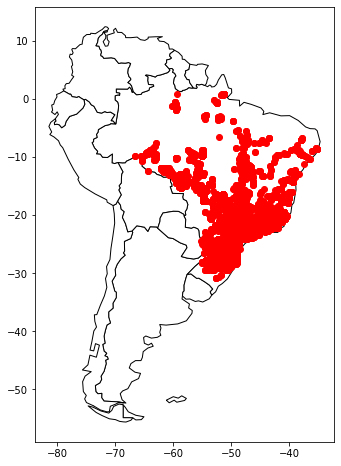

In [11]:
### 
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
ax = world[world.continent == 'South America'].plot(figsize=(8,8), color='white', edgecolor='black')

gdf_RHN[gdf_RHN.TipoRedeEnergetica == 1.0].plot(ax=ax, color='red')

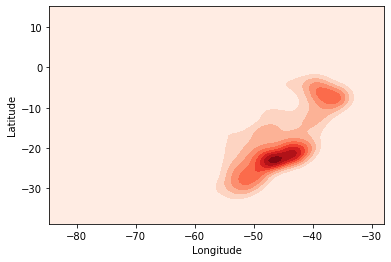

In [12]:
sns.kdeplot(df_RHN['Longitude'], df_RHN['Latitude'], shade=True, cmap= 'Reds')

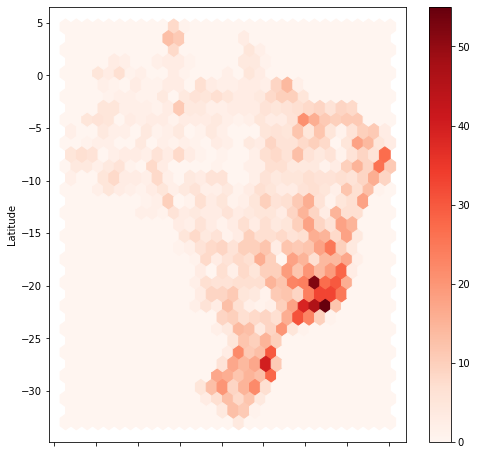

In [13]:
df_RHN[df_RHN.TipoRedeBasica == 1.0].plot.hexbin(x='Longitude', y='Latitude', gridsize=30, figsize=(8,8), cmap='Reds')


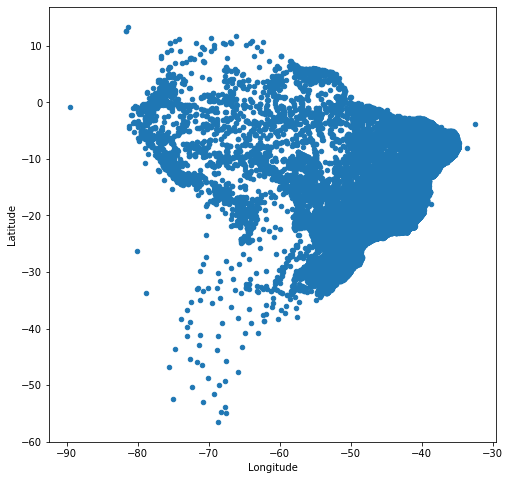

In [14]:
# plotar todas as estacoes
df.plot.scatter(y='Latitude', x='Longitude', figsize=(8,8))


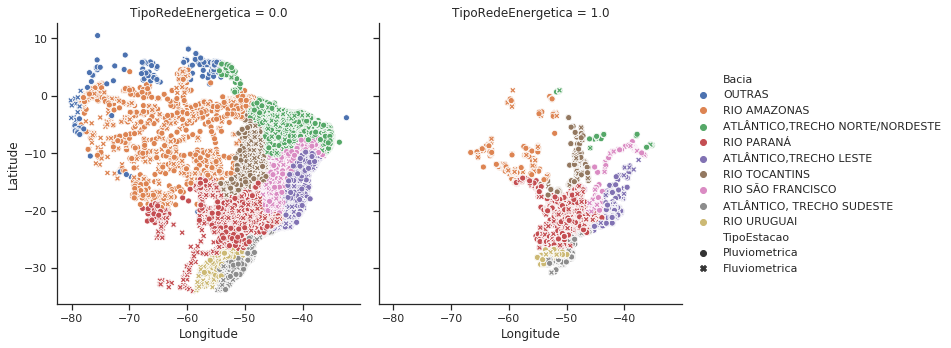

In [15]:
# plotar todas as estacoes por categorias
sns.set(style="ticks", color_codes=True)
sns.relplot(y='Latitude', x='Longitude', hue='Bacia', col='TipoRedeEnergetica', style='TipoEstacao', data=df_RHN)
